In [1]:
## EDA libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
#import shap

## feature engineering libraries
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.model_selection import train_test_split

## model preparation libraries
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier,ExtraTreesClassifier
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor,XGBClassifier

from sklearn.metrics import (accuracy_score, 
                            classification_report,
                            roc_auc_score, roc_curve, auc, precision_recall_curve,
                            confusion_matrix)

## model evaluation libraries
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import metrics
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import StratifiedKFold, KFold
## model hyperparameter tuning
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

import joblib
%matplotlib inline

C:\Users\rshah5\Anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\rshah5\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\rshah5\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
df = pd.read_csv('Dataset.csv')
pd.set_option('display.max_columns', None)

In [3]:
df.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_invasive_max,d1_diasbp_invasive_min,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_invasive_max,d1_mbp_invasive_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_invasive_max,d1_sysbp_invasive_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_invasive_max,h1_mbp_invasive_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_invasive_max,h1_sysbp_invasive_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,0,73.9,2.3,113.0,502.01,0,0.0,0.4,31.0,2.51,NaN,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,NaN,NaN,NaN,NaN,36.0,134.0,39.3,NaN,0.0,14.1,46.0,32.0,68.0,37.0,68.0,37.0,119.0,72.0,66.0,40.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,122.0,64.0,131.0,73.0,131.0,73.0,39.9,37.2,NaN,NaN,68.0,63.0,68.0,63.0,119.0,108.0,NaN,NaN,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,NaN,NaN,131.0,115.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,NaN,NaN,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,0,70.2,NaN,1

In [4]:
df.columns

Index(['encounter_id', 'patient_id', 'hospital_id', 'hospital_death', 'age',
       'bmi', 'elective_surgery', 'ethnicity', 'gender', 'height',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure',
       'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object', length=186)

In [5]:
df.shape

(91713, 186)

In [6]:
df.dtypes

encounter_id                     int64
patient_id                       int64
hospital_id                      int64
hospital_death                   int64
age                            float64
                                ...   
leukemia                       float64
lymphoma                       float64
solid_tumor_with_metastasis    float64
apache_3j_bodysystem            object
apache_2_bodysystem             object
Length: 186, dtype: object

In [7]:
df.nunique()

encounter_id                   91713
patient_id                     91713
hospital_id                      147
hospital_death                     2
age                               74
                               ...  
leukemia                           2
lymphoma                           2
solid_tumor_with_metastasis        2
apache_3j_bodysystem              11
apache_2_bodysystem               10
Length: 186, dtype: int64

In [8]:
df.isnull().sum()

encounter_id                      0
patient_id                        0
hospital_id                       0
hospital_death                    0
age                            4228
                               ... 
leukemia                        715
lymphoma                        715
solid_tumor_with_metastasis     715
apache_3j_bodysystem           1662
apache_2_bodysystem            1662
Length: 186, dtype: int64

In [9]:
for i in range(0,len(df.columns)):
    if df.isnull().sum()[i] >91713/2.5 :
        print(df.columns[i])
        
        #print(df.isnull().sum()[i]/91713*100)
        #df = df.dropna(df.columns[i], axis=1)
    

albumin_apache
bilirubin_apache
fio2_apache
paco2_apache
paco2_for_ph_apache
pao2_apache
ph_apache
urineoutput_apache
d1_diasbp_invasive_max
d1_diasbp_invasive_min
d1_mbp_invasive_max
d1_mbp_invasive_min
d1_sysbp_invasive_max
d1_sysbp_invasive_min
h1_diasbp_invasive_max
h1_diasbp_invasive_min
h1_mbp_invasive_max
h1_mbp_invasive_min
h1_sysbp_invasive_max
h1_sysbp_invasive_min
d1_albumin_max
d1_albumin_min
d1_bilirubin_max
d1_bilirubin_min
d1_inr_max
d1_inr_min
d1_lactate_max
d1_lactate_min
h1_albumin_max
h1_albumin_min
h1_bilirubin_max
h1_bilirubin_min
h1_bun_max
h1_bun_min
h1_calcium_max
h1_calcium_min
h1_creatinine_max
h1_creatinine_min
h1_glucose_max
h1_glucose_min
h1_hco3_max
h1_hco3_min
h1_hemaglobin_max
h1_hemaglobin_min
h1_hematocrit_max
h1_hematocrit_min
h1_inr_max
h1_inr_min
h1_lactate_max
h1_lactate_min
h1_platelets_max
h1_platelets_min
h1_potassium_max
h1_potassium_min
h1_sodium_max
h1_sodium_min
h1_wbc_max
h1_wbc_min
d1_arterial_pco2_max
d1_arterial_pco2_min
d1_arterial_ph_m

In [10]:
df_new = df.drop(['albumin_apache','bilirubin_apache','fio2_apache','paco2_apache','paco2_for_ph_apache','pao2_apache',
'ph_apache',
'urineoutput_apache',
'd1_diasbp_invasive_max',
'd1_diasbp_invasive_min',
'd1_mbp_invasive_max',
'd1_mbp_invasive_min',
'd1_sysbp_invasive_max',
'd1_sysbp_invasive_min',
'h1_diasbp_invasive_max',
'h1_diasbp_invasive_min',
'h1_mbp_invasive_max',
'h1_mbp_invasive_min',
'h1_sysbp_invasive_max',
'h1_sysbp_invasive_min',
'd1_albumin_max',
'd1_albumin_min',
'd1_bilirubin_max',
'd1_bilirubin_min',
'd1_inr_max',
'd1_inr_min',
'd1_lactate_max',
'd1_lactate_min',
'h1_albumin_max',
'h1_albumin_min',
'h1_bilirubin_max',
'h1_bilirubin_min',
'h1_bun_max',
'h1_bun_min',
'h1_calcium_max',
'h1_calcium_min',
'h1_creatinine_max',
'h1_creatinine_min',
'h1_glucose_max',
'h1_glucose_min',
'h1_hco3_max',
'h1_hco3_min',
'h1_hemaglobin_max',
'h1_hemaglobin_min',
'h1_hematocrit_max',
'h1_hematocrit_min',
'h1_inr_max',
'h1_inr_min',
'h1_lactate_max',
'h1_lactate_min',
'h1_platelets_max',
'h1_platelets_min',
'h1_potassium_max',
'h1_potassium_min',
'h1_sodium_max',
'h1_sodium_min',
'h1_wbc_max',
'h1_wbc_min',
'd1_arterial_pco2_max',
'd1_arterial_pco2_min',
'd1_arterial_ph_max',
'd1_arterial_ph_min',
'd1_arterial_po2_max',
'd1_arterial_po2_min',
'd1_pao2fio2ratio_max',
'd1_pao2fio2ratio_min',
'h1_arterial_pco2_max',
'h1_arterial_pco2_min',
'h1_arterial_ph_max',
'h1_arterial_ph_min',
'h1_arterial_po2_max',
'h1_arterial_po2_min',
'h1_pao2fio2ratio_max',
'h1_pao2fio2ratio_min'],axis =1)

In [11]:
df_new.shape

(91713, 112)

In [12]:
for i in range(0,len(df_new.columns)):
    #if df_new.isnull().sum()[i] >0:
        print(df_new.columns[i])
        print(df_new[df_new.columns[i]].nunique())
        print(df_new[df_new.columns[i]].value_counts())

encounter_id
91713
2049      1
118035    1
11567     1
15661     1
5416      1
         ..
66165     1
78451     1
74353     1
76400     1
2047      1
Name: encounter_id, Length: 91713, dtype: int64
patient_id
91713
4098      1
64821     1
122193    1
120144    1
79180     1
         ..
82621     1
84668     1
94907     1
92856     1
8188      1
Name: patient_id, Length: 91713, dtype: int64
hospital_id
147
118    4333
19     3925
188    3095
161    2792
70     2754
       ... 
4         7
23        7
95        6
93        6
130       2
Name: hospital_id, Length: 147, dtype: int64
hospital_death
2
0    83798
1     7915
Name: hospital_death, dtype: int64
age
74
67.0    2271
68.0    2173
71.0    2141
72.0    2110
66.0    2059
        ... 
19.0     343
20.0     338
18.0     259
17.0     126
16.0      44
Name: age, Length: 74, dtype: int64
bmi
34888
14.844926    443
67.814990    422
24.017768     87
24.208110     86
27.359332     82
            ... 
35.960072      1
32.452383      1
34.5188

91
60.0     2649
61.0     2578
64.0     2575
62.0     2549
59.0     2548
         ... 
24.0       97
108.0      90
111.0      78
109.0      75
110.0      72
Name: d1_mbp_min, Length: 91, dtype: int64
d1_mbp_noninvasive_max
122
96.0     2008
98.0     1994
100.0    1983
97.0     1963
103.0    1953
         ... 
178.0      33
176.0      30
180.0      30
177.0      26
179.0      23
Name: d1_mbp_noninvasive_max, Length: 122, dtype: int64
d1_mbp_noninvasive_min
91
60.0     2562
61.0     2540
64.0     2513
63.0     2511
59.0     2500
         ... 
24.0       98
108.0      92
111.0      77
109.0      74
110.0      68
Name: d1_mbp_noninvasive_min, Length: 91, dtype: int64
d1_resprate_max
79
24.0    6273
22.0    5631
20.0    5469
25.0    5330
26.0    5280
        ... 
82.0      22
91.0      22
90.0      19
87.0      15
89.0      13
Name: d1_resprate_max, Length: 79, dtype: int64
d1_resprate_min
55
12.0     10962
14.0      9142
16.0      7711
13.0      7612
10.0      7423
11.0      7385
15.0     

47
8.5     4688
8.4     4651
8.6     4529
8.3     4447
8.2     4339
8.7     4186
8.8     4043
8.1     4022
8.0     3648
8.9     3635
7.9     3258
9.0     3118
7.8     2928
9.1     2573
7.7     2570
7.6     2196
9.2     2142
7.5     1866
9.3     1772
7.4     1541
9.4     1388
7.3     1245
9.5     1050
7.2     1008
7.1      855
9.6      852
7.0      697
9.7      655
6.9      509
9.8      496
6.2      490
10.8     377
6.8      377
9.9      345
6.7      330
6.6      286
10.0     268
10.1     219
6.5      201
6.4      162
10.2     150
10.3     132
10.4     109
10.5      94
6.3       89
10.6      56
10.7      52
Name: d1_calcium_max, dtype: int64
d1_calcium_min
49
8.4     4366
8.3     4345
8.5     4317
8.2     4241
8.1     4143
8.6     4095
8.0     3916
8.7     3654
7.9     3604
8.8     3506
7.8     3316
7.7     3017
8.9     2986
7.6     2660
9.0     2460
7.5     2360
9.1     2039
7.4     2017
7.3     1709
9.2     1614
7.2     1436
9.3     1347
7.1     1266
7.0     1101
9.4      992
6.9     

In [13]:
'''plt.figure(figsize=(22,17))
sns.set(font_scale=0.8)
sns.heatmap(df_new.corr(), annot=True, cmap='viridis')'''

"plt.figure(figsize=(22,17))\nsns.set(font_scale=0.8)\nsns.heatmap(df_new.corr(), annot=True, cmap='viridis')"

In [14]:
df_new = df_new.drop(['readmission_status'],axis = 1)

In [15]:
df_new.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.541667,73.9,113.0,502.01,0,0.0,31.0,2.51,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,36.0,134.0,39.3,0.0,14.1,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,131.0,115.0,39.5,37.5,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.927778,70.2,108.0,203.01,0,0.0,9.0,0.56,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0.0,46.0,33.0,145.0,35.1,1.0,12.7,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,95.0,71.0,36.3,36.3,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,23.3,12.7,0.47,0.29,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,admit,Med-Surg ICU,0.000694,95.3,122.0,703.03,0,0.0,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0.0,68.0,37.0,NaN,36.7,0.0,NaN,88.0,48.0,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,148.0,105.0,37.0,36.7,88.0,58.0,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,148.0,124.0,36.7,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,admit,CTICU,0.000694,61.7,203.0,1206.03,1,0.0,NaN,NaN,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1.0,60.0,4.0,NaN,34.8,1.0,8.0,48.0,42.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,158.0,84.0,38.0,34.8,62.0,44.0,NaN,NaN,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,NaN,NaN,35.6,34.8,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,9.0,8.0,0.04,0.03,0.0,0.0,0.0,0.0,0.0,

In [16]:
for i in range(0,len(df_new.columns)):
    #if df_new.isnull().sum()[i] >0:
        print(df_new.columns[i])
        print(df_new[df_new.columns[i]].isnull().sum())
        #print(df_new[df_new.columns[i]].value_counts())

encounter_id
0
patient_id
0
hospital_id
0
hospital_death
0
age
4228
bmi
3429
elective_surgery
0
ethnicity
1395
gender
25
height
1334
hospital_admit_source
21409
icu_admit_source
112
icu_id
0
icu_stay_type
0
icu_type
0
pre_icu_los_days
0
weight
2720
apache_2_diagnosis
1662
apache_3j_diagnosis
1101
apache_post_operative
0
arf_apache
715
bun_apache
19262
creatinine_apache
18853
gcs_eyes_apache
1901
gcs_motor_apache
1901
gcs_unable_apache
1037
gcs_verbal_apache
1901
glucose_apache
11036
heart_rate_apache
878
hematocrit_apache
19878
intubated_apache
715
map_apache
994
resprate_apache
1234
sodium_apache
18600
temp_apache
4108
ventilated_apache
715
wbc_apache
22012
d1_diasbp_max
165
d1_diasbp_min
165
d1_diasbp_noninvasive_max
1040
d1_diasbp_noninvasive_min
1040
d1_heartrate_max
145
d1_heartrate_min
145
d1_mbp_max
220
d1_mbp_min
220
d1_mbp_noninvasive_max
1479
d1_mbp_noninvasive_min
1479
d1_resprate_max
385
d1_resprate_min
385
d1_spo2_max
333
d1_spo2_min
333
d1_sysbp_max
159
d1_sysbp_min
159
d

In [17]:
df_new.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
encounter_id,91713.0,NaN,NaN,NaN,65606.07928,37795.088538,1.0,32852.0,65665.0,98342.0,131051.0
patient_id,91713.0,NaN,NaN,NaN,65537.131464,37811.252183,1.0,32830.0,65413.0,98298.0,131051.0
hospital_id,91713.0,NaN,NaN,NaN,105.669262,62.854406,2.0,47.0,109.0,161.0,204.0
hospital_death,91713.0,NaN,NaN,NaN,0.086302,0.280811,0.0,0.0,0.0,0.0,1.0
age,87485.0,NaN,NaN,NaN,62.309516,16.775119,16.0,52.0,65.0,75.0,89.0
...,...,...,...,...,...,...,...,...,...,...,...
leukemia,90998.0,NaN,NaN,NaN,0.007066,0.083763,0.0,0.0,0.0,0.0,1.0
lymphoma,90998.0,NaN,NaN,NaN,0.004132,0.064148,0.0,0.0,0.0,0.0,1.0
solid_tumor_with_metastasis,90998.0,NaN,NaN,NaN,0.020638,0.142169,0.0,0.0,0.0,0.0,1.0
apache_3j_bodysystem,90051,11,Cardiovascular,29999,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
df_new['age'].isnull().sum()

4228

In [19]:
df_new['age'].median()

65.0

In [20]:
df_new['age'].fillna(df_new['age'].median(), inplace = True)

In [21]:
df_new['bmi'].describe(include = 'all').T

count    88284.000000
mean        29.185818
std          8.275142
min         14.844926
25%         23.641975
50%         27.654655
75%         32.930206
max         67.814990
Name: bmi, dtype: float64

In [22]:
df_new['bmi'].median()

27.65465458

In [23]:
df_new['bmi'].fillna(df_new['bmi'].median,inplace =True)

In [24]:
df_new['bmi'].isnull().sum()

0

In [25]:
df_new.isnull().sum(axis=0).sort_values(ascending=False)[df_new.isnull().sum(axis=0).sort_values(ascending=False) > 25000]

Series([], dtype: int64)

In [26]:
print(df_new.isnull().sum(axis=0).sort_values(ascending=False))

wbc_apache               22012
h1_temp_max              21732
h1_temp_min              21732
hospital_admit_source    21409
hematocrit_apache        19878
                         ...  
icu_stay_type                0
icu_type                     0
pre_icu_los_days             0
apache_post_operative        0
encounter_id                 0
Length: 111, dtype: int64


In [27]:
pd.set_option('display.max_rows', 250)

In [28]:
df_new.drop(['encounter_id', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'patient_id', 'hospital_id'], 
              axis=1,
             inplace = True)

In [29]:
df_new.shape

(91713, 104)

**Removing missing values from Inter related Columns Like BMI,Weight,Height**

In [30]:
df_new = df_new[df_new[['bmi', 'weight', 'height']].isna().sum(axis=1) == 0]
df_new

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.73,0,Caucasian,M,180.3,CTICU,0.541667,73.9,113.0,502.01,0,0.0,31.0,2.51,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,36.0,134.0,39.3,0.0,14.10,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.0,63.0,68.0,63.0,119.0,108.0,86.0,85.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,131.0,115.0,39.5,37.5,31.0,30.0,8.5,7.4,2.51,2.23,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,233.0,233.0,4.0,3.4,136.0,134.0,14.10,14.10,0.10,0.05,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.42,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,108.0,203.01,0,0.0,9.0,0.56,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0.0,46.0,33.0,145.0,35.1,1.0,12.70,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.0,48.0,61.0,48.0,114.0,100.0,85.0,57.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,95.0,71.0,36.3,36.3,11.0,9.0,8.6,8.0,0.71,0.56,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,557.0,487.0,4.2,3.8,145.0,145.0,23.30,12.70,0.47,0.29,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.95,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,122.0,703.03,0,0.0,NaN,NaN,3.0,6.0,0.0,5.0,NaN,102.0,NaN,0.0,68.0,37.0,NaN,36.7,0.0,NaN,88.0,48.0,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,148.0,105.0,37.0,36.7,88.0,58.0,88.0,58.0,96.0,78.0,91.0,83.0,91.0,83.0,20.0,16.0,98.0,91.0,148.0,124.0,148.0,124.0,36.7,36.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.64,1,Caucasian,F,165.1,CTICU,0.000694,61.7,203.0,1206.03,1,0.0,NaN,NaN,4.0,6.0,0.0,5.0,185.0,114.0,25.9,1.0,60.0,4.0,NaN,34.8,1.0,8.00,48.0,42.0,48.0,42.0,116.0,92.0,84.0,84.0,84.0,84.0,23.0,7.0,100.0,95.0,158.0,84.0,158.0,84.0,38.0,34.8,62.0,44.0,NaN,NaN,100.0,96.0,92.0,71.0,NaN,NaN,12.0,11.0,100.0,99.0,136.0,106.0,NaN,NaN,35.6,34.8,NaN,NaN,NaN,NaN,NaN,NaN,185.0,88.0,NaN,NaN,11.6,8.9,34.0,25.9,198.0,43.0,5.0,3.5,NaN,NaN,9.00,8.00,0.04,0.03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
5,0,67.0,27.56,0,Caucasian,M,190.5,Med-Surg ICU,0.000694,100.0,301.0,403.01,0,0.0,13.0,0.71,4.0,6.0,0.0,5.0,156.0,113.0,44.2,0.0,130.0,35.0,137.0,36.6,0.0,10.90,100.0,61.0,100.0,61.0,113.0,83.0,127.0,80.0,127.0,80.0,32.0,10.0,97.0,91.0,173.0,107.0,173.0

# **Univariate Analysis**

In [31]:
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

In [32]:
fig = px.histogram(df_new[['age','gender','hospital_death','bmi']].dropna(), x="age", y="hospital_death", color="gender",
                   marginal="box", # or violin, rug
                   hover_data=df_new[['age','gender','hospital_death','bmi']].columns)
fig.show()

In [33]:
age_death_F=df_new[df_new['gender']=='F'][['age','hospital_death']].groupby('age').mean().reset_index()
age_death_M=df_new[df_new['gender']=='M'][['age','hospital_death']].groupby('age').mean().reset_index()
from plotly.subplots import make_subplots
fig = make_subplots()
fig.add_trace(
    go.Scatter(x=age_death_F['age'], y=age_death_F['hospital_death'], name="Female patients"))
fig.add_trace(
    go.Scatter(x=age_death_M['age'], y=age_death_M['hospital_death'],name="Male patients"))
fig.update_layout(
    title_text="<b>Average hospital death probability of patients<b>")
fig.update_xaxes(title_text="<b>Patient Age<b>")
fig.update_yaxes(title_text="<b>Average Hospital Death</b>", secondary_y=False)
fig.show()

# Preprocessing

converting categorical values  
tranforming numerical columns and removing nulls

Null values for *categories* are replaced by **mode**, and those for *numerical* are replaced by **mean**

In [34]:
df_new.dtypes

hospital_death                     int64
age                              float64
bmi                               object
elective_surgery                   int64
ethnicity                         object
gender                            object
height                           float64
icu_type                          object
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              int64
arf_apache                       float64
bun_apache                       float64
creatinine_apache                float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                float64
gcs_verbal_apache                float64
glucose_apache                   float64
heart_rate_apache                float64
hematocrit_apache                float64
intubated_apache                 float64
map_apache      

In [35]:
# object - Categorical
# Int64 - Numerical Categorical
# Float - Numerical

In [36]:
df_new['bmi'] = df_new['bmi'].astype('float64')

In [37]:
df_new.select_dtypes(include ='O').columns

Index(['ethnicity', 'gender', 'icu_type', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object')

In [38]:
df_new.nunique()[df_new.nunique() == 2].index.tolist()

['hospital_death',
 'elective_surgery',
 'gender',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

In [39]:
categorical = ['ethnicity', 'gender', 'icu_type', 'apache_3j_bodysystem',
       'apache_2_bodysystem']
numerical_categorical = ['elective_surgery',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']


In [40]:
not_numeric = df_new[numerical_categorical + categorical + ['hospital_death']].columns.tolist()
numeric_only = df_new.drop(not_numeric,axis=1).columns.tolist()
numeric_only

['age',
 'bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'apache_2_diagnosis',
 'apache_3j_diagnosis',
 'bun_apache',
 'creatinine_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'glucose_apache',
 'heart_rate_apache',
 'hematocrit_apache',
 'map_apache',
 'resprate_apache',
 'sodium_apache',
 'temp_apache',
 'wbc_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_temp_max',
 'd1_temp_min',
 'h1_diasbp_max',
 'h1_diasbp_min',
 'h1_diasbp_noninvasive_max',
 'h1_diasbp_noninvasive_min',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'h1_mbp_noninvasive_max',
 'h1_mbp_noninvasive_min',
 'h1_re

In [41]:
for col in numerical_categorical:
    df_new[col] = df_new[col].astype('Int64')
   

In [42]:
for col in numerical_categorical:
    df_new[col] = df_new[col].fillna(df_new[col].mode()[0])

In [43]:
df_new.dtypes

hospital_death                     int64
age                              float64
bmi                              float64
elective_surgery                   Int64
ethnicity                         object
gender                            object
height                           float64
icu_type                          object
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              Int64
arf_apache                         Int64
bun_apache                       float64
creatinine_apache                float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                  Int64
gcs_verbal_apache                float64
glucose_apache                   float64
heart_rate_apache                float64
hematocrit_apache                float64
intubated_apache                   Int64
map_apache      

In [44]:
for col in numeric_only:
    df[col] = df_new[col].fillna(df_new[col].mean())
    df_new[col] = df_new[col].fillna(df_new[col].mean())

In [45]:
df_new.isna().sum(axis=0).sort_values(ascending=False)

apache_2_bodysystem              1566
apache_3j_bodysystem             1566
ethnicity                        1211
gender                             18
h1_sysbp_noninvasive_max            0
d1_glucose_max                      0
d1_creatinine_min                   0
d1_creatinine_max                   0
d1_calcium_min                      0
d1_calcium_max                      0
d1_bun_min                          0
d1_bun_max                          0
h1_temp_min                         0
h1_temp_max                         0
h1_sysbp_noninvasive_min            0
h1_sysbp_max                        0
h1_sysbp_min                        0
d1_hco3_max                         0
h1_spo2_min                         0
h1_spo2_max                         0
h1_resprate_min                     0
h1_resprate_max                     0
h1_mbp_noninvasive_min              0
h1_mbp_noninvasive_max              0
h1_mbp_min                          0
h1_mbp_max                          0
h1_heartrate

In [46]:
df_new = df_new.dropna(axis=0)

In [47]:
df_new.isna().sum(axis=0).sort_values(ascending=False)

hospital_death                   0
age                              0
d1_glucose_max                   0
d1_creatinine_min                0
d1_creatinine_max                0
d1_calcium_min                   0
d1_calcium_max                   0
d1_bun_min                       0
d1_bun_max                       0
h1_temp_min                      0
h1_temp_max                      0
h1_sysbp_noninvasive_min         0
h1_sysbp_noninvasive_max         0
h1_sysbp_min                     0
h1_sysbp_max                     0
h1_spo2_min                      0
h1_spo2_max                      0
h1_resprate_min                  0
h1_resprate_max                  0
h1_mbp_noninvasive_min           0
h1_mbp_noninvasive_max           0
h1_mbp_min                       0
h1_mbp_max                       0
h1_heartrate_min                 0
h1_heartrate_max                 0
d1_glucose_min                   0
d1_hco3_max                      0
d1_hco3_min                      0
apache_4a_hospital_d

In [48]:
df_new[categorical].nunique()

ethnicity                6
gender                   2
icu_type                 8
apache_3j_bodysystem    11
apache_2_bodysystem     10
dtype: int64

#  One Hot Encoding 

In [49]:
icu_data = pd.get_dummies(df_new,
    prefix='isin',
    prefix_sep='_',
    columns=categorical,
    drop_first=False)

In [50]:
icu_data

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,isin_African American,isin_Asian,isin_Caucasian,isin_Hispanic,isin_Native American,isin_Other/Unknown,isin_F,isin_M,isin_CCU-CTICU,isin_CSICU,isin_CTICU,isin_Cardiac ICU,isin_MICU,isin_Med-Surg ICU,isin_Neuro ICU,isin_SICU,isin_Cardiovascular,isin_Gastrointestinal,isin_Genitourinary,isin_Gynecological,isin_Hematological,isin_Metabolic,isin_Musculoskeletal/Skin,isin_Neurological,isin_Respiratory,isin_Sepsis,isin_Trauma,isin_Cardiovascular,isin_Gastrointestinal,isin_Haematologic,isin_Metabolic,isin_Neurologic,isin_Renal/Genitourinary,isin_Respiratory,isin_Trauma,isin_Undefined Diagnoses,isin_Undefined diagnoses
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,0,31.00000,2.51000,3.0,6.0,0,4.0,168.000000,118.0,27.400000,0,40.0,36.0,134.000000,39.3,0,14.100000,68.0,37.0,68.0,37.0,119.0,72.0,89.0,46.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,131.0,73.0,39.9,37.2,68.000000,63.000000,68.000000,63.000000,119.000000,108.000000,86.000000,85.000000,86.000000,85.000000,26.000000,18.000000,100.000000,74.000000,131.00000,115.0000,131.000000,115.000000,39.500000,37.50000,31.000000,30.000000,8.500000,7.400000,2.510000,2.230000,168.000000,109.000000,19.000000,15.000000,8.900000,8.900000,27.400000,27.400000,233.0000,233.000000,4.000000,3.400000,136.000000,134.000000,14.100000,14.10000,0.10,0.05,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,0,9.00000,0.56000,1.0,3.0,0,1.0,145.000000,120.0,36.900000,0,46.0,33.0,145.000000,35.1,1,12.700000,95.0,31.0,95.0,31.0,118.0,72.0,120.0,38.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,159.0,67.0,36.3,35.1,61.000000,48.000000,61.000000,48.000000,114.000000,100.000000,85.000000,57.000000,85.000000,57.000000,31.000000,28.000000,95.000000,70.000000,95.00000,71.0000,95.000000,71.000000,36.300000,36.30000,11.000000,9.000000,8.600000,8.000000,0.710000,0.560000,145.000000,128.000000,27.000000,26.000000,11.300000,11.100000,36.900000,36.100000,557.0000,487.000000,4.200000,3.800000,145.000000,145.000000,23.300000,12.70000,0.47,0.29,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2,0,25.0,31.950000,0,172.7,0.000694,95.3,122.0,703.03,0,0,25.81644,1.47879,3.0,6.0,0,5.0,160.505268,102.0,32.956005,0,68.0,37.0,137.948423,36.7,0,12.151952,88.0,48.0,88.0,48.0,96.0,68.0,102.0,68.0,102.0,68.0,21.0,8.0,98.0,91.0,148.0,105.0,148.0,105.0,37.0,36.7,8

In [51]:
icu_data.dtypes

hospital_death                     int64
age                              float64
bmi                              float64
elective_surgery                   Int64
height                           float64
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              Int64
arf_apache                         Int64
bun_apache                       float64
creatinine_apache                float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                  Int64
gcs_verbal_apache                float64
glucose_apache                   float64
heart_rate_apache                float64
hematocrit_apache                float64
intubated_apache                   Int64
map_apache                       float64
resprate_apache                  float64
sodium_apache                    float64
temp_apache     

In [52]:
icu_data.columns = [x.lower() for x in icu_data.columns.to_list()]

In [53]:
icu_data.columns

Index(['hospital_death', 'age', 'bmi', 'elective_surgery', 'height',
       'pre_icu_los_days', 'weight', 'apache_2_diagnosis',
       'apache_3j_diagnosis', 'apache_post_operative',
       ...
       'isin_cardiovascular', 'isin_gastrointestinal', 'isin_haematologic',
       'isin_metabolic', 'isin_neurologic', 'isin_renal/genitourinary',
       'isin_respiratory', 'isin_trauma', 'isin_undefined diagnoses',
       'isin_undefined diagnoses'],
      dtype='object', length=136)

In [54]:
icu_data['arf_apache'].values.dtype

Int64Dtype()

In [55]:
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

In [56]:
icu_data = icu_data.loc[:,~icu_data.columns.duplicated()]

In [57]:
icu_data.shape

(85519, 130)

In [60]:
t = icu_data['arf_apache'].dtype
for col in tqdm(icu_data.columns.tolist()):
    if icu_data[col].values.dtype == 'uint8' or t == icu_data[col].values.dtype:
        icu_data[col] = icu_data[col].astype(int)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 130/130 [00:00<00:00, 3420.74it/s]


In [61]:
icu_data.dtypes

hospital_death                     int64
age                              float64
bmi                              float64
elective_surgery                   int32
height                           float64
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              int32
arf_apache                         int32
bun_apache                       float64
creatinine_apache                float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                  int32
gcs_verbal_apache                float64
glucose_apache                   float64
heart_rate_apache                float64
hematocrit_apache                float64
intubated_apache                   int32
map_apache                       float64
resprate_apache                  float64
sodium_apache                    float64
temp_apache     

In [62]:
icu_data = icu_data.drop_duplicates()

In [63]:
icu_data.shape

(85519, 130)

# Modeling

In [64]:
X = icu_data.drop(['hospital_death'], axis=1)
Y = icu_data['hospital_death']

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.33, random_state=11)

In [66]:
y_train.value_counts()

0    52352
1     4945
Name: hospital_death, dtype: int64

In [67]:
y_test.value_counts()

0    25826
1     2396
Name: hospital_death, dtype: int64

In [68]:
def modelling(X_train, y_train, X_test, y_test, **kwargs):
    scores = {}
    models = []
    if 'xgb' in kwargs.keys() and kwargs['xgb']:
        xgb = XGBClassifier()
        xgb.fit(X_train._get_numeric_data(), np.ravel(y_train, order='C'))
        y_pred = xgb.predict(X_test._get_numeric_data())
        scores['xgb']= [accuracy_score(y_test, y_pred), roc_auc_score(y_test, y_pred)]
        models.append(xgb)
#         scores['xgb']['roc_auc'] = roc_auc_score(y_test, y_pred)

    if 'rf' in kwargs.keys() and kwargs['rf']:
        rf = RandomForestClassifier(n_estimators=200)
        rf.fit(X_train, y_train)
        y_pred = rf.predict(X_test)
        scores['rf']= [accuracy_score(y_test, y_pred), roc_auc_score(y_test, y_pred)]
#         scores['rf']['roc_auc'] = roc_auc_score(y_test, y_pred)
        models.append(rf)

    if 'extree' in kwargs.keys() and kwargs['extree']:
        extree = ExtraTreesClassifier()
        extree.fit(X_train, y_train)
        y_pred = extree.predict(X_test)
        scores['extree'] = [accuracy_score(y_test, y_pred), roc_auc_score(y_test, y_pred)]
#         scores['extree']['roc_auc'] = roc_auc_score(y_test, y_pred)
        models.append(extree)
        
    return scores

In [69]:
modelling(X_train,y_train, X_test, y_test, xgb=True, rf=True, extree=True)

{'xgb': [0.9263340656225639, 0.6589191121990535],
 'rf': [0.9283891999149599, 0.6212312474636023],
 'extree': [0.9261214655233506, 0.5972736899711658]}

In [70]:
xgb_tuned = XGBClassifier(n_estimators=3000,
    objective='binary:logistic',
    booster="gbtree",
    learning_rate=0.01,
    scale_pos_weight=1,
    max_depth=4,
    min_child_weight=6,
    gamma=0,
    subsample=0.4,
    colsample_bytree=0.8,
    reg_alpha=0.08,
    n_jobs=-1)

In [71]:
xgb_tuned.fit(X_train._get_numeric_data(), np.ravel(y_train, order='C'))
y__hat = xgb_tuned.predict(X_test._get_numeric_data())

In [72]:
y__hat[21:300]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [73]:
def model_performance(model, y_test, y_hat) : 
    conf_matrix = confusion_matrix(y_test, y_hat)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Viridis', showscale  = False)

    #Show metrics
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    fp = conf_matrix[0,1]
    tn = conf_matrix[0,0]
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                   y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto',
                   orientation = 'h', opacity = 0.8,marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))
    
    #Roc curve
    model_roc_auc = round(roc_auc_score(y_test, y_hat) , 3)
    fpr, tpr, t = roc_curve(y_test, y_hat)
    trace3 = go.Scatter(x = fpr,y = tpr,
                        name = "Roc : " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2), fill='tozeroy')
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    
    # Precision-recall curve
    precision, recall, thresholds = precision_recall_curve(y_test, y_hat)
    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision" + str(precision),
                        line = dict(color = ('lightcoral'),width = 2), fill='tozeroy')
    
     
    #plots
    model = model
    
    #Subplots
    fig = tls.make_subplots(rows=2, cols=2, print_grid=False, 
                          specs=[ 
#                               [{'colspan': 2}, None],
                                 [{}, {}],
                                 [{}, {}],
                                 
#                                  [{'colspan': 2}, None]
                                ],
                          subplot_titles=('Confusion Matrix',
                                        'Metrics',
                                        'ROC curve'+" "+ '('+ str(model_roc_auc)+')',
                                        'Precision - Recall curve',
                                        ))
    
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report</b><br>'+str(model),
                        autosize = False, height = 1500,width = 830,
                        plot_bgcolor = 'rgba(240,240,240, 0.95)',
                        paper_bgcolor = 'rgba(240,240,240, 0.95)',
                        margin = dict(b = 195))
#     fig["layout"]["xaxis2"].update((dict(range=[0, 1])))
#     fig["layout"]["xaxis3"].update(dict(title = "false positive rate"))
#     fig["layout"]["yaxis3"].update(dict(title = "true positive rate"))
#     fig["layout"]["xaxis4"].update(dict(title = "recall"), range = [0,1.05])
#     fig["layout"]["yaxis4"].update(dict(title = "precision"), range = [0,1.05])
#     fig["layout"]["xaxis5"].update(dict(title = "Percentage contacted"))
#     fig["layout"]["yaxis5"].update(dict(title = "Percentage positive targeted"))
    fig.layout.titlefont.size = 14
    
    py.iplot(fig)

In [74]:
model_performance(xgb_tuned,y_test, y__hat)

In [75]:
X_test_sample = X_test.sample(2500)
X_test_sample

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bun_apache,creatinine_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,resprate_apache,sodium_apache,temp_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_diasbp_noninvasive_max,d1_diasbp_noninvasive_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_mbp_noninvasive_max,d1_mbp_noninvasive_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_sysbp_noninvasive_max,d1_sysbp_noninvasive_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_mbp_noninvasive_max,h1_mbp_noninvasive_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_sysbp_noninvasive_max,h1_sysbp_noninvasive_min,h1_temp_max,h1_temp_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,isin_african american,isin_asian,isin_caucasian,isin_hispanic,isin_native american,isin_other/unknown,isin_f,isin_m,isin_ccu-cticu,isin_csicu,isin_cticu,isin_cardiac icu,isin_micu,isin_med-surg icu,isin_neuro icu,isin_sicu,isin_cardiovascular,isin_gastrointestinal,isin_genitourinary,isin_gynecological,isin_hematological,isin_metabolic,isin_musculoskeletal/skin,isin_neurological,isin_respiratory,isin_sepsis,isin_trauma,isin_haematologic,isin_neurologic,isin_renal/genitourinary,isin_undefined diagnoses
80074,23.0,20.826493,0,175.30,0.511806,64.00,123.0,702.01,0,0,7.00000,0.47000,4.0,6.0,0,5.0,250.000000,129.0,32.956005,0,71.0,29.0,134.000000,37.00,0,12.151952,85.0,56.0,85.0,56.0,113.0,68.0,93.0,67.0,93.0,67.0,27.0,12.0,100.0,97.0,120.0,101.0,120.0,101.0,37.20,37.000,61.0,56.0,61.000000,56.000000,91.0,87.0,71.0,67.0,71.000000,67.000000,21.000000,18.000000,100.0,99.0,105.0,101.0,105.000000,101.000000,36.710987,36.60755,7.0,3.0,8.100000,7.500000,0.56,0.47,250.0,116.0,24.000000,14.000000,11.442849,10.878016,34.508379,32.917841,207.0948,196.691924,3.6,3.1,139.0,134.0,12.498696,11.32823,0.01,0.00,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
73932,77.0,38.092173,0,167.60,0.043750,107.00,301.0,403.01,0,0,16.00000,1.30000,4.0,6.0,0,5.0,112.000000,54.0,36.200000,0,162.0,43.0,139.000000,36.40,0,8.700000,90.0,43.0,90.0,43.0,69.0,55.0,146.0,81.0,146.0,81.0,24.0,12.0,96.0,94.0,206.0,134.0,206.0,134.0,36.60,36.400,90.0,90.0,90.000000,90.000000,69.0,69.0,146.0,138.0,146.000000,138.000000,24.000000,24.000000,96.0,96.0,206.0,194.0,206.000000,195.000000,36.600000,36.60000,16.0,16.0,9.100000,9.100000,1.30,1.30,112.0,112.0,29.000000,29.000000,12.400000,12.400000,36.200000,36.200000,205.0000,205.000000,4.3,4.3,139.0,139.0,8.700000,8.70000,0.08,0.03,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
66380,65.0,28.537108,0,157.40,0.102778,70.70,106.0,212.01,0,0,25.81644,1.47879,4.0,6.0,0,5.0,160.505268,87.0,32.956005,0,59.0,32.0,137.948423,38.88,1,12.151952,99.0,43.0,99.0,43.0,81.0,70.0,105.0,59.0,105.0,59.0,27.0,17.0,98.0,90.0,132.0,97.0,132.0,97.0,38.88,36.550,50.0,47.0,50.000000,47.000000,75.0,72.0,67.0,61.0,67.000000,61.000000,25.000000,23.000000,98.0,94.0,115.0,110.0,115.000000,110.000000,37.770000,37.77000,65.0,65.0,8.380479,8.179045,2.32,2.32,144.0,144.0,20.000000,20.000000,11.300000,11.300000,34.600000,34.600000,148.0000,148.000000,3.9,3.9,143.0,143.0,12.590000,1

In [76]:
joblib.dump(xgb_tuned,'xgb_tuned.pkl',compress=3)

['xgb_tuned.pkl']

In [79]:
!pip install shap

  Attempting uninstall: packaging
    Found existing installation: packaging 20.9
    Uninstalling packaging-20.9:
      Successfully uninstalled packaging-20.9


In [80]:
import shap

In [81]:
shap.initjs()
shap_values = shap.TreeExplainer(xgb_tuned).shap_values(X_test_sample)

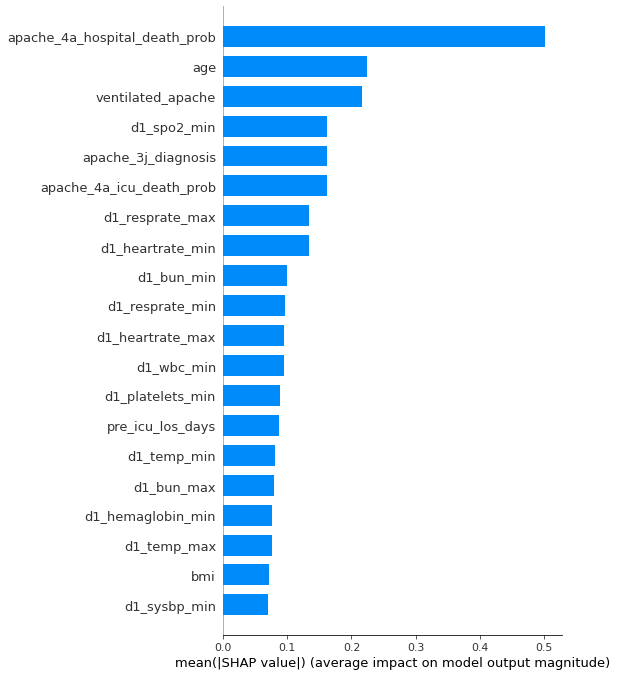

In [82]:
shap.summary_plot(shap_values, X_test_sample, plot_type="bar")

In [83]:
shap.force_plot(shap.TreeExplainer(xgb_tuned).expected_value, shap_values[0:257,:], X_test_sample.iloc[0:257,:])